In [122]:
import time
startTime=time.time()

import tensorflow as tf


tf.compat.v1.disable_eager_execution() #此代码必须放在模型加载之前，否则不成功。此代码是为了解决K.gradients错误RuntimeError: tf.gradients is not supported when eager execution is enabled. GradientTape instead.
                                        #TF2.0默认为动态图，即eager模式。K.gradients在此模式下会出错。

from tensorflow.keras import backend as K
import matplotlib.pyplot as plt
import numpy as np
import os
from tensorflow.keras.models import load_model
model = load_model('.\\checkpoint\\checkpoint873.ckpt')  
model.summary()

#参数
image_shape=(128,128,3)

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_42 (Conv2D)          (None, 256, 256, 4)       112       
                                                                 
 max_pooling2d_42 (MaxPoolin  (None, 128, 128, 4)      0         
 g2D)                                                            
                                                                 
 dropout_42 (Dropout)        (None, 128, 128, 4)       0         
                                                                 
 conv2d_43 (Conv2D)          (None, 128, 128, 4)       148       
                                                                 
 max_pooling2d_43 (MaxPoolin  (None, 64, 64, 4)        0         
 g2D)                                                            
                                                                 
 dropout_43 (Dropout)        (None, 64, 64, 4)        

In [123]:
#查看中间结果
layer_name = 'conv2d_42'
filter_index = 1
layer_output = model.get_layer(layer_name).output
print('layer_output=',layer_output)
loss = K.mean(layer_output[:, :, :, filter_index])
print('loss=',loss)
grads = K.gradients(loss, model.input)
print('grads=',grads) 
print('len（grads）=',len(grads)) #列表长度为1
grads = K.gradients(loss, model.input)[0]
print('grads=',grads)
#print('len（grads）=',len(grads)) #出错
grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)
iterate = K.function([model.input], [loss, grads])
#loss_value, grads_value = iterate([np.zeros((1, 150, 150, 3))])


layer_output= Tensor("conv2d_42_10/Relu:0", shape=(None, 256, 256, 4), dtype=float32)
loss= Tensor("Mean_508:0", shape=(), dtype=float32)
grads= [<tf.Tensor 'gradients_264/conv2d_42_10/Conv2D_grad/Conv2DBackpropInput:0' shape=(None, 256, 256, 3) dtype=float32>]
len（grads）= 1
grads= Tensor("gradients_265/conv2d_42_10/Conv2D_grad/Conv2DBackpropInput:0", shape=(None, 256, 256, 3), dtype=float32)


input_img_data[0]= [[[0.39963748 0.81592965 0.49570773]
  [0.8896553  0.03874222 0.99845038]
  [0.64448601 0.34563333 0.51411302]
  ...
  [0.65228598 0.2501702  0.50831149]
  [0.93635018 0.11911622 0.43257855]
  [0.05814102 0.3940286  0.08418201]]

 [[0.96315086 0.022059   0.19191256]
  [0.48618632 0.27524345 0.17088178]
  [0.31684282 0.33816755 0.16767701]
  ...
  [0.5637994  0.79059503 0.42789488]
  [0.80914389 0.67199127 0.16403391]
  [0.52334131 0.83399553 0.1695989 ]]

 [[0.47686913 0.78556415 0.13022205]
  [0.7759019  0.4611919  0.68676512]
  [0.35259883 0.16806528 0.67605712]
  ...
  [0.88551729 0.78239936 0.94027761]
  [0.46781779 0.14997533 0.51596568]
  [0.1693471  0.77279596 0.42799341]]

 ...

 [[0.49662103 0.03779537 0.1713044 ]
  [0.46424355 0.86036726 0.68969852]
  [0.75268977 0.13724532 0.77885978]
  ...
  [0.24630597 0.5040943  0.73941299]
  [0.29836736 0.76122184 0.01080155]
  [0.17358459 0.54322576 0.2402021 ]]

 [[0.81036335 0.57123086 0.58284566]
  [0.07800022 0.30

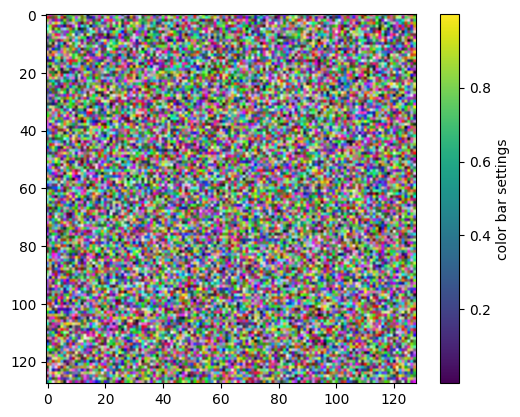

In [124]:
'''
input_img_data = np.random.random((1, image_shape[0], image_shape[1], 3)) * 255
print('input_img_data[0]=',input_img_data[0].astype('uint8'))
plt.imshow(input_img_data[0].astype('uint8')) #必须变为整数，否则图像显示失败
cb = plt.colorbar(label='color bar settings') #通过colorbar()函数可以创建最简单的颜色条
plt.show()
'''
input_img_data = np.random.random((1, image_shape[0], image_shape[1], 3)) 
print('input_img_data[0]=',input_img_data[0])
plt.imshow(input_img_data[0]) 
cb = plt.colorbar(label='color bar settings') #通过colorbar()函数可以创建最简单的颜色条
plt.show()

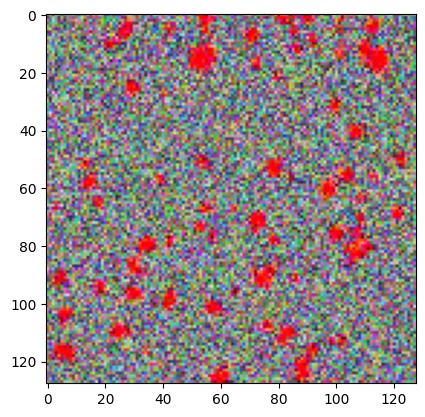

In [127]:
#梯度上升法
step = 0.005
epochs=40
input_img =np.random.random((1, image_shape[0], image_shape[1], 3)) 
for i in range(epochs):
    loss_value, grads_value = iterate([input_img])
    input_img += grads_value * step

#处理图像数据用于显示
def deprocess_image(x):
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.25
    x += 0.5
    #x = np.clip(x, 0, 1)
    #x *= 255
    x = np.clip(x, 0, 1)
    return x

img = deprocess_image(input_img[0])
plt.imshow(img)
plt.show()
##梯度下降法
#input_img_data = np.random.random((1, 150, 150, 3)) * 20+128
#step = 1.
#for i in range(40):
#    loss_value, grads_value = iterate([input_img_data])
#    input_img_data -= grads_value * step
#def deprocess_image(x):
#    x -= x.mean()
#    x /= (x.std() + 1e-5)
#    x *= 0.1
#    x += 0.5
#    x = np.clip(x, 0, 1)
#    x *= 255
#    x = np.clip(x, 0, 255).astype('uint8')
#    return x
#img = input_img_data[0]
#img = deprocess_image(img)
#plt.imshow(img)
#plt.show()



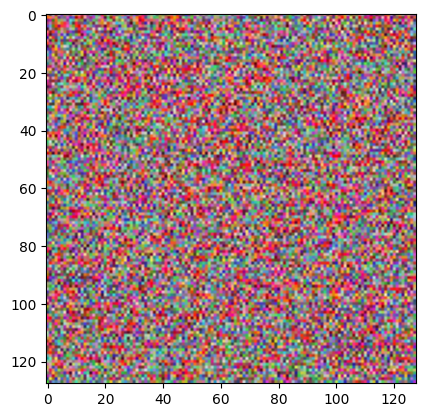

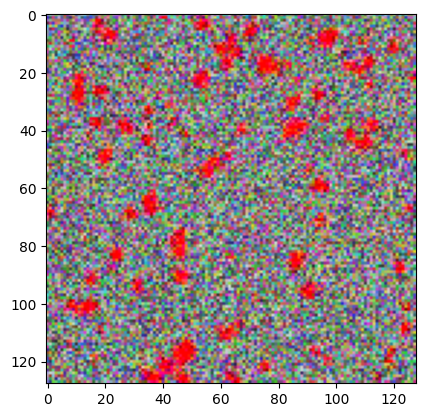

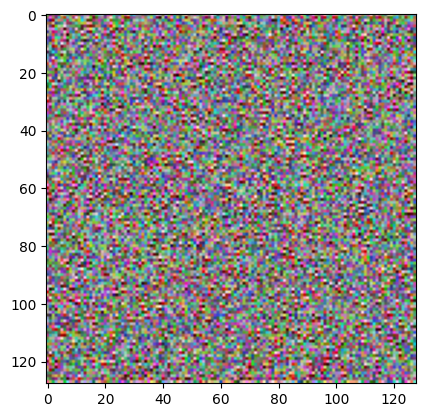

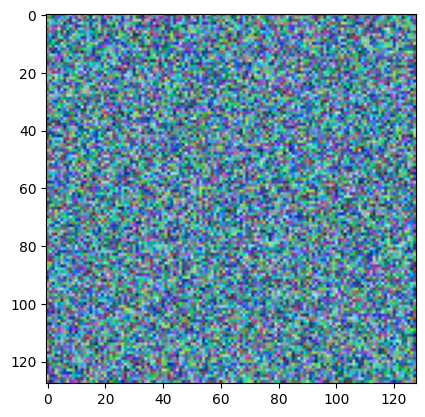

In [128]:
#P138
def generate_pattern(layer_name, filter_index, size=image_shape[0]):
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])
    grads = K.gradients(loss, model.input)[0]
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)
    iterate = K.function([model.input], [loss, grads])
    input_img_data = np.random.random((1, image_shape[0], image_shape[1], 3)) 
    
    for i in range(epochs):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step
    img = input_img_data[0]
    return deprocess_image(img)


plt.imshow(generate_pattern('conv2d_42', 0))
plt.show()
plt.imshow(generate_pattern('conv2d_42', 1))
plt.show()
plt.imshow(generate_pattern('conv2d_42', 2))
plt.show()
plt.imshow(generate_pattern('conv2d_42', 3))
plt.savefig(os.path.join('.\\output1','conv2d_42 3'+'.png'))
plt.show()

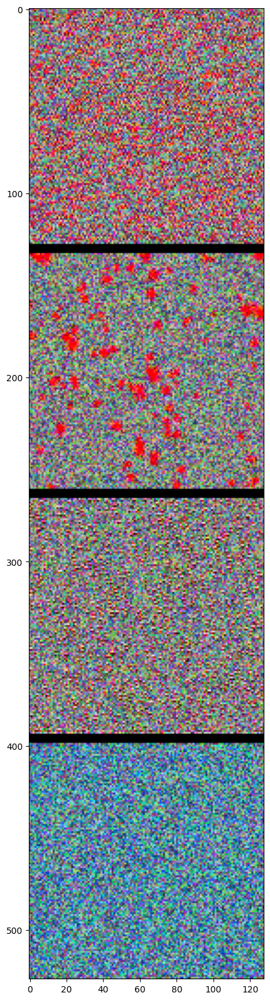

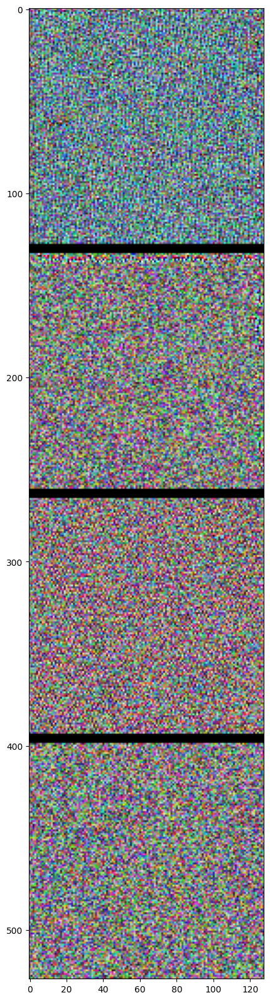

In [129]:
for layer_name in ['conv2d_42', 'conv2d_43']: 
    size = image_shape[0]
    margin = 5 #每条黑边像素,RGB格式，3个通道全是0代表黑色
    num_filters=4 #神经元数目
    results = np.zeros((num_filters * size +(num_filters-1)* margin, 1 * size + 0 * margin, 3)) #8个图片之间7条黑边
    for i in range(num_filters):  
        for j in range(1):  
            filter_img = generate_pattern(layer_name, i + (j * 2), size=size)
            #print('filter_img=',filter_img) #全部是0~255的整数格式
            horizontal_start = i * size + i * margin
            horizontal_end = horizontal_start + size
            vertical_start = j * size + j * margin
            vertical_end = vertical_start + size
            results[horizontal_start: horizontal_end, vertical_start: vertical_end, :] = filter_img
            #print('results=',results) 
    plt.figure(figsize=(20, 20))
    plt.imshow(results)
    plt.savefig(os.path.join('.\\output1',layer_name+'.png'))
    plt.show()



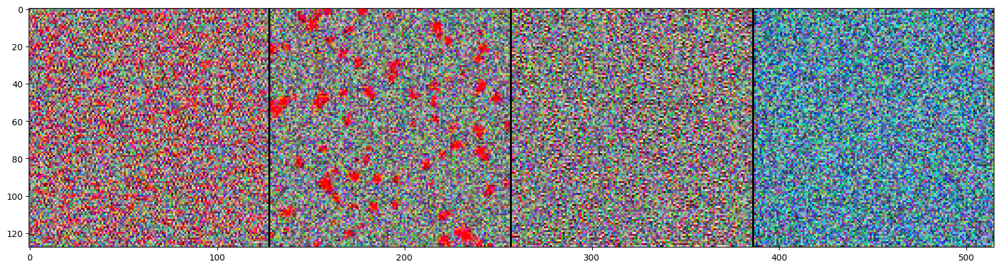

In [135]:
for layer_name in ['conv2d_42']: 
    size = image_shape[0]
    num_filters=4 #神经元数目
    margin = 1 #每条黑边像素,RGB格式，3个通道全是0代表黑色
    results = np.zeros((1 * size, num_filters * size +(num_filters-1)* margin, 3)) #8个图片之间7条黑边
    for j in range(num_filters):  
        filter_img = generate_pattern(layer_name, j, size=size)
        #print('filter_img=',filter_img) #全部是0~255的整数格式
        horizontal_start = 0
        horizontal_end = horizontal_start + size
        vertical_start = j * size + j * margin
        vertical_end = vertical_start + size
        results[horizontal_start: horizontal_end, vertical_start: vertical_end, :] = filter_img
        #print('results=',results) 
    plt.figure(figsize=(20, 20))
    plt.imshow(results)
    plt.savefig(os.path.join('.\\output1',layer_name+'other.png'))
    plt.show()


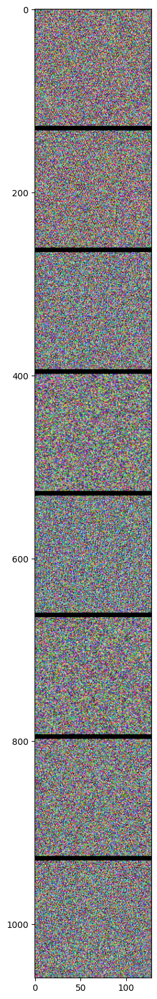

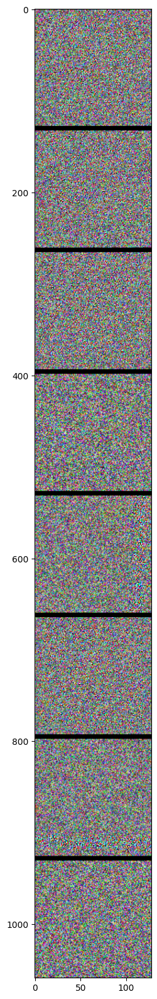

In [119]:
for layer_name in ['conv2d_44', 'conv2d_45']: 
    size = image_shape[0]
    margin = 5 #每条黑边像素,RGB格式，3个通道全是0代表黑色
    num_filters=8 #神经元数目
    results = np.zeros((num_filters * size +(num_filters-1)* margin, 1 * size + 0 * margin, 3)) #8个图片之间7条黑边
    for i in range(num_filters):  
        for j in range(1):  
            filter_img = generate_pattern(layer_name, i + (j * 2), size=size)
            #print('filter_img=',filter_img) #全部是0~255的整数格式
            horizontal_start = i * size + i * margin
            horizontal_end = horizontal_start + size
            vertical_start = j * size + j * margin
            vertical_end = vertical_start + size
            results[horizontal_start: horizontal_end, vertical_start: vertical_end, :] = filter_img
            #print('results=',results) 
    plt.figure(figsize=(20, 20))
    plt.imshow(results) 
    plt.savefig(os.path.join('.\\output1',layer_name+'.png'))
    plt.show()

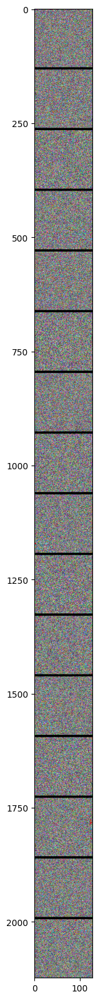

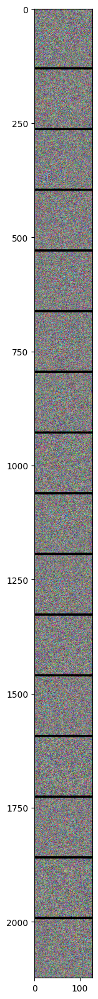

In [120]:
for layer_name in ['conv2d_46', 'conv2d_47']: 
    size = image_shape[0]
    margin = 5 #每条黑边像素,RGB格式，3个通道全是0代表黑色
    num_filters=16 #神经元数目
    results = np.zeros((num_filters * size +(num_filters-1)* margin, 1 * size + 0 * margin, 3)) #8个图片之间7条黑边
    for i in range(num_filters):  
        for j in range(1):  
            filter_img = generate_pattern(layer_name, i + (j * 2), size=size)
            #print('filter_img=',filter_img) #全部是0~255的整数格式
            horizontal_start = i * size + i * margin
            horizontal_end = horizontal_start + size
            vertical_start = j * size + j * margin
            vertical_end = vertical_start + size
            results[horizontal_start: horizontal_end, vertical_start: vertical_end, :] = filter_img
            #print('results=',results) 
    plt.figure(figsize=(20, 20))
    plt.imshow(results) 
    plt.savefig(os.path.join('.\\output1',layer_name+'.png'))
    plt.show()

In [121]:
endTime=time.time()
print('How many seconds:',(endTime-startTime))

How many seconds: 279.7164649963379
